# 2D and 3D Blast Visulaisation

## Imports

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

## Load the pre-blast and post-blast files

In [2]:
# Update these paths if your files are stored elsewhere
data_path = "data"
PRE_POLYGON_PATH = f"{data_path}/preblast_polygon.csv"
POST_POLYGON_PATH = f"{data_path}/displaced_polygon.csv"
PRE_PARTICLES_PATH = f"{data_path}/preblast_particles.csv"
POST_PARTICLES_PATH = f"{data_path}/postblast_particles.csv"

pre_poly = pd.read_csv(PRE_POLYGON_PATH)
post_poly = pd.read_csv(POST_POLYGON_PATH)
pre_particles = pd.read_csv(PRE_PARTICLES_PATH)
post_particles = pd.read_csv(POST_PARTICLES_PATH)

print("Pre-blast polygon:", pre_poly.shape)
print("Post-blast polygon:", post_poly.shape)
print("Pre-blast particles:", pre_particles.shape)
print("Post-blast particles:", post_particles.shape)

display(pre_poly.head())
display(post_poly.head())
display(pre_particles.head())
display(post_particles.head())

Pre-blast polygon: (11, 5)
Post-blast polygon: (11, 18)
Pre-blast particles: (8032, 19)
Post-blast particles: (8032, 51)


,pattern_id,pattern_type,point_id,x,y
0,5,Production,1,363471.621849,6.591708e+06
1,5,Production,2,363471.403824,6.591708e+06
2,5,Production,3,363464.468673,6.591711e+06
3,5,Production,4,363458.410635,6.591713e+06
4,5,Production,5,363451.230228,6.591716e+06


,pattern_id,pattern_type,point_id,x,y,pre_x,pre_y,dx_m,dy_m,post_x,post_y,toe_dx_m,toe_dy_m,toe_post_x,toe_post_y,toe_horizontal_displacement_m,pre_top_z_m,pre_floor_z_m
0,5,Production,1,363471.621849,6.591708e+06,363471.621849,6.591708e+06,8.415304,1.553446,363480.037153,6.591710e+06,15.563564,2.373628,363487.185413,6.591711e+06,15.743527,200.0,185.0
1,5,Production,2,363471.403824,6.591708e+06,363471.403824,6.591708e+06,8.302279,1.563934,363479.706103,6.591710e+06,15.189227,2.372011,363486.593051,6.591711e+06,15.373322,200.0,185.0
2,5,Production,3,363464.468673,6.591711e+06,363464.468673,6.591711e+06,5.807382,1.033265,363470.276055,6.591712e+06,7.458644,1.214413,363471.927317,6.591712e+06,7.556862,200.0,185.0
3,5,Production,4,363458.410635,6.591713e+06,363458.410635,6.591713e+06,4.280310,0.671508,363462.690945,6.591714e+06,4.189322,0.638291,363462.599957,6.591714e+06,4.237669,200.0,185.0
4,5,Production,5,363451.230228,6.591716e+06,363451.230228,6.591716e+06,3.055588,0.479900,363454.285816,6.591717e+06,2.512298,0.394535,363453.742526,6.591717e+06,2.543089,200.0,185.0


,particle_id,column_id,layer,pre_x,pre_y,pre_z,pre_volume_m3,pre_cell_area_m2,z_fraction_from_floor,depth_fraction_from_top,pre_floor_z_m,pre_top_z_m,nearest_hole_id,nearest_hole_distance_m,lithology,mineral_domain,structure_domain,digability,coarse_risk
0,1,1,1,363448.942738,6.591717e+06,185.9375,1.655532,0.88295,0.0625,0.9375,185.0,200.0,5-H-006,3.941658,propylitic_volcanics,waste,background,hard,bad
1,2,1,2,363448.942738,6.591717e+06,187.8125,1.655532,0.88295,0.1875,0.8125,185.0,200.0,5-H-006,3.941658,propylitic_volcanics,waste,background,hard,bad
2,3,1,3,363448.942738,6.591717e+06,189.6875,1.655532,0.88295,0.3125,0.6875,185.0,200.0,5-H-006,3.941658,propylitic_volcanics,waste,background,hard,bad
3,4,1,4,363448.942738,6.591717e+06,191.5625,1.655532,0.88295,0.4375,0.5625,185.0,200.0,5-H-006,3.941658,propylitic_volcanics,waste,background,hard,bad
4,5,1,5,363448.942738,6.591717e+06,193.4375,1.655532,0.88295,0.5625,0.4375,185.0,200.0,5-H-006,3.941658,propylitic_volcanics,waste,background,hard,bad


,particle_id,column_id,layer,pre_x,pre_y,pre_z,pre_volume_m3,pre_cell_area_m2,z_fraction_from_floor,depth_fraction_from_top,...,model_vertical_heave_m,post_x,post_y,post_volume_m3,topo_i,topo_j,post_z,post_floor_z_m,post_surface_z_m,post_muckpile_height_m
0,1,1,1,363448.942738,6.591717e+06,185.9375,1.655532,0.88295,0.0625,0.9375,...,2.648882,363451.392605,6.591717e+06,2.019749,0,7,186.014185,185.0,189.960724,4.960724
1,2,1,2,363448.942738,6.591717e+06,187.8125,1.655532,0.88295,0.1875,0.8125,...,2.683508,363451.497114,6.591717e+06,2.019749,0,7,186.090864,185.0,189.960724,4.960724
2,3,1,3,363448.942738,6.591717e+06,189.6875,1.655532,0.88295,0.3125,0.6875,...,2.718134,363451.529156,6.591717e+06,2.019749,0,7,186.867234,185.0,189.960724,4.960724
3,4,1,4,363448.942738,6.591717e+06,191.5625,1.655532,0.88295,0.4375,0.5625,...,2.752760,363451.359421,6.591717e+06,2.019749,0,7,187.062584,185.0,189.960724,4.960724
4,5,1,5,363448.942738,6.591717e+06,193.4375,1.655532,0.88295,0.5625,0.4375,...,2.787386,363451.716983,6.591717e+06,2.019749,0,7,188.410145,185.0,189.960724,4.960724


## Helper functions for plotting

In [3]:
def close_polygon_xy(x, y):
    """
    Ensures polygon coordinates close back to the first point.
    """
    x = list(x)
    y = list(y)

    if len(x) == 0:
        return x, y

    if x[0] != x[-1] or y[0] != y[-1]:
        x.append(x[0])
        y.append(y[0])

    return x, y


def close_polygon_xyz(x, y, z):
    """
    Ensures 3D polygon coordinates close back to the first point.
    """
    x = list(x)
    y = list(y)
    z = list(z)

    if len(x) == 0:
        return x, y, z

    if x[0] != x[-1] or y[0] != y[-1] or z[0] != z[-1]:
        x.append(x[0])
        y.append(y[0])
        z.append(z[0])

    return x, y, z


def add_local_coordinates(df, x_cols, y_cols, origin_x=None, origin_y=None):
    """
    Adds local coordinate columns to avoid plotting large mine grid values directly.
    This makes axes easier to read while preserving relative geometry.
    """
    out = df.copy()

    if origin_x is None:
        origin_x = min(out[col].min() for col in x_cols if col in out.columns)

    if origin_y is None:
        origin_y = min(out[col].min() for col in y_cols if col in out.columns)

    for col in x_cols:
        if col in out.columns:
            out[f"{col}_local"] = out[col] - origin_x

    for col in y_cols:
        if col in out.columns:
            out[f"{col}_local"] = out[col] - origin_y

    return out, origin_x, origin_y

## Create local coordinates for cleaner visualisation

In [4]:
# Use a common origin so all datasets line up correctly
all_x_values = pd.concat([
    pre_poly["x"],
    post_poly["pre_x"],
    post_poly["post_x"],
    pre_particles["pre_x"],
    post_particles["post_x"]
])

all_y_values = pd.concat([
    pre_poly["y"],
    post_poly["pre_y"],
    post_poly["post_y"],
    pre_particles["pre_y"],
    post_particles["post_y"]
])

origin_x = all_x_values.min()
origin_y = all_y_values.min()

pre_poly_local, _, _ = add_local_coordinates(
    pre_poly,
    x_cols=["x"],
    y_cols=["y"],
    origin_x=origin_x,
    origin_y=origin_y
)

post_poly_local, _, _ = add_local_coordinates(
    post_poly,
    x_cols=["pre_x", "post_x", "x"],
    y_cols=["pre_y", "post_y", "y"],
    origin_x=origin_x,
    origin_y=origin_y
)

pre_particles_local, _, _ = add_local_coordinates(
    pre_particles,
    x_cols=["pre_x"],
    y_cols=["pre_y"],
    origin_x=origin_x,
    origin_y=origin_y
)

post_particles_local, _, _ = add_local_coordinates(
    post_particles,
    x_cols=["pre_x", "post_x"],
    y_cols=["pre_y", "post_y"],
    origin_x=origin_x,
    origin_y=origin_y
)

print(f"Local coordinate origin: X={origin_x:.2f}, Y={origin_y:.2f}")

Local coordinate origin: X=363447.94, Y=6591703.49


## Side-by-side 2D plan view: pre-blast vs post-blast

In [5]:
# Optional downsampling for faster plotting
MAX_POINTS_2D = 8000

pre_plot_2d = pre_particles_local.sample(
    min(MAX_POINTS_2D, len(pre_particles_local)),
    random_state=42
)

post_plot_2d = post_particles_local.sample(
    min(MAX_POINTS_2D, len(post_particles_local)),
    random_state=42
)

pre_x_closed, pre_y_closed = close_polygon_xy(
    pre_poly_local["x_local"],
    pre_poly_local["y_local"]
)

post_x_closed, post_y_closed = close_polygon_xy(
    post_poly_local["post_x_local"],
    post_poly_local["post_y_local"]
)

fig_2d = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=("Pre-blast pattern", "Post-blast displaced muckpile"),
    horizontal_spacing=0.08
)

# Pre-blast particles
fig_2d.add_trace(
    go.Scatter(
        x=pre_plot_2d["pre_x_local"],
        y=pre_plot_2d["pre_y_local"],
        mode="markers",
        marker=dict(
            size=4,
            color=pre_plot_2d["pre_z"],
            colorscale="Viridis",
            colorbar=dict(title="Pre Z<br>(m)", x=0.46),
            opacity=0.65
        ),
        name="Pre-blast particles",
        hovertemplate=(
            "X: %{x:.1f} m<br>"
            "Y: %{y:.1f} m<br>"
            "Z: %{marker.color:.1f} m<br>"
            "<extra></extra>"
        )
    ),
    row=1,
    col=1
)

# Pre-blast polygon
fig_2d.add_trace(
    go.Scatter(
        x=pre_x_closed,
        y=pre_y_closed,
        mode="lines",
        line=dict(width=3),
        name="Pre-blast polygon",
        hoverinfo="skip"
    ),
    row=1,
    col=1
)

# Post-blast particles
fig_2d.add_trace(
    go.Scatter(
        x=post_plot_2d["post_x_local"],
        y=post_plot_2d["post_y_local"],
        mode="markers",
        marker=dict(
            size=4,
            color=post_plot_2d["post_z"],
            colorscale="Turbo",
            colorbar=dict(title="Post Z<br>(m)", x=1.02),
            opacity=0.65
        ),
        name="Post-blast particles",
        hovertemplate=(
            "X: %{x:.1f} m<br>"
            "Y: %{y:.1f} m<br>"
            "Z: %{marker.color:.1f} m<br>"
            "<extra></extra>"
        )
    ),
    row=1,
    col=2
)

# Post-blast polygon
fig_2d.add_trace(
    go.Scatter(
        x=post_x_closed,
        y=post_y_closed,
        mode="lines",
        line=dict(width=3),
        name="Post-blast polygon",
        hoverinfo="skip"
    ),
    row=1,
    col=2
)

fig_2d.update_xaxes(title_text="Local Easting (m)", scaleanchor="y", scaleratio=1, row=1, col=1)
fig_2d.update_yaxes(title_text="Local Northing (m)", row=1, col=1)

fig_2d.update_xaxes(title_text="Local Easting (m)", scaleanchor="y2", scaleratio=1, row=1, col=2)
fig_2d.update_yaxes(title_text="Local Northing (m)", row=1, col=2)

fig_2d.update_layout(
    title="2D Plan View: Pre-blast vs Post-blast",
    width=1400,
    height=650,
    template="plotly_white",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.18,
        xanchor="center",
        x=0.5
    )
)

fig_2d.show()

## Side-by-side interactive 3D point cloud: pre-blast vs post-blast

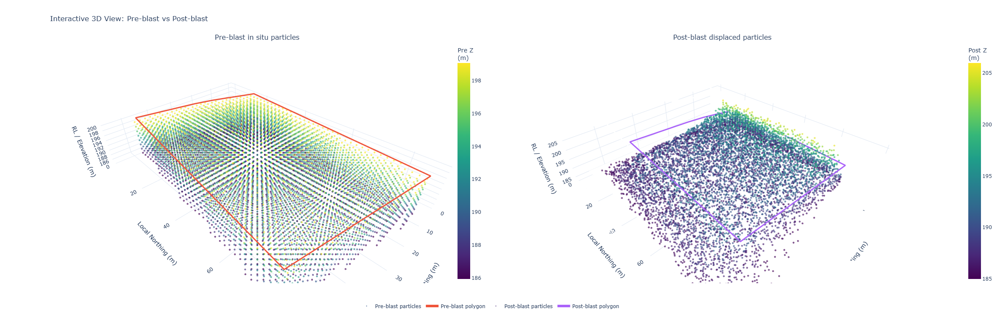

In [8]:
# Optional downsampling for responsive 3D rendering
MAX_POINTS_3D = 8000

pre_plot_3d = pre_particles_local.sample(
    min(MAX_POINTS_3D, len(pre_particles_local)),
    random_state=42
)

post_plot_3d = post_particles_local.sample(
    min(MAX_POINTS_3D, len(post_particles_local)),
    random_state=42
)

# Polygon elevations
pre_top_z = pre_particles_local["pre_top_z_m"].median()
post_surface_z = post_particles_local["post_surface_z_m"].median()

pre_x_3d, pre_y_3d, pre_z_3d = close_polygon_xyz(
    pre_poly_local["x_local"],
    pre_poly_local["y_local"],
    [pre_top_z] * len(pre_poly_local)
)

post_x_3d, post_y_3d, post_z_3d = close_polygon_xyz(
    post_poly_local["post_x_local"],
    post_poly_local["post_y_local"],
    [post_surface_z] * len(post_poly_local)
)

fig_3d = make_subplots(
    rows=1,
    cols=2,
    specs=[[{"type": "scene"}, {"type": "scene"}]],
    subplot_titles=("Pre-blast in situ particles", "Post-blast displaced particles"),
    horizontal_spacing=0.02
)

# Pre-blast particle cloud
fig_3d.add_trace(
    go.Scatter3d(
        x=pre_plot_3d["pre_x_local"],
        y=pre_plot_3d["pre_y_local"],
        z=pre_plot_3d["pre_z"],
        mode="markers",
        marker=dict(
            size=2.5,
            color=pre_plot_3d["pre_z"],
            colorscale="Viridis",
            opacity=0.65,
            colorbar=dict(title="Pre Z<br>(m)", x=0.46)
        ),
        name="Pre-blast particles",
        hovertemplate=(
            "X: %{x:.1f} m<br>"
            "Y: %{y:.1f} m<br>"
            "Z: %{z:.1f} m<br>"
            "<extra></extra>"
        )
    ),
    row=1,
    col=1
)

# Pre-blast polygon outline
fig_3d.add_trace(
    go.Scatter3d(
        x=pre_x_3d,
        y=pre_y_3d,
        z=pre_z_3d,
        mode="lines",
        line=dict(width=6),
        name="Pre-blast polygon",
        hoverinfo="skip"
    ),
    row=1,
    col=1
)

# Post-blast particle cloud
fig_3d.add_trace(
    go.Scatter3d(
        x=post_plot_3d["post_x_local"],
        y=post_plot_3d["post_y_local"],
        z=post_plot_3d["post_z"],
        mode="markers",
        marker=dict(
            size=2.5,
            color=post_plot_3d["post_z"],
            colorscale="Viridis",
            opacity=0.65,
            colorbar=dict(title="Post Z<br>(m)", x=1.02)
        ),
        name="Post-blast particles",
        hovertemplate=(
            "X: %{x:.1f} m<br>"
            "Y: %{y:.1f} m<br>"
            "Z: %{z:.1f} m<br>"
            "<extra></extra>"
        )
    ),
    row=1,
    col=2
)

# Post-blast polygon outline
fig_3d.add_trace(
    go.Scatter3d(
        x=post_x_3d,
        y=post_y_3d,
        z=post_z_3d,
        mode="lines",
        line=dict(width=6),
        name="Post-blast polygon",
        hoverinfo="skip"
    ),
    row=1,
    col=2
)

fig_3d.update_layout(
    title="Interactive 3D View: Pre-blast vs Post-blast",
    width=1500,
    height=750,
    template="plotly_white",
    scene=dict(
        xaxis_title="Local Easting (m)",
        yaxis_title="Local Northing (m)",
        zaxis_title="RL / Elevation (m)",
        aspectmode="data"
    ),
    scene2=dict(
        xaxis_title="Local Easting (m)",
        yaxis_title="Local Northing (m)",
        zaxis_title="RL / Elevation (m)",
        aspectmode="data"
    ),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.12,
        xanchor="center",
        x=0.5
    )
)

fig_3d.show()

## Displacement vectors in 2D

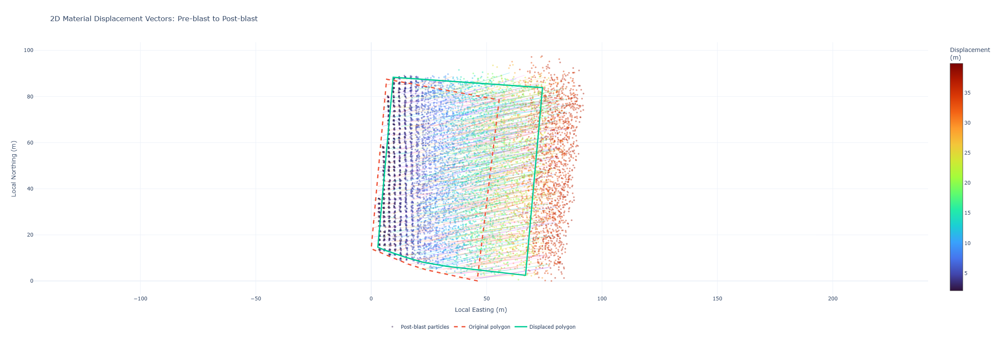

In [7]:
# Use one vector per column to avoid overcrowding
column_vectors = (
    post_particles_local
    .groupby("column_id", as_index=False)
    .agg(
        pre_x_local=("pre_x_local", "mean"),
        pre_y_local=("pre_y_local", "mean"),
        post_x_local=("post_x_local", "mean"),
        post_y_local=("post_y_local", "mean"),
        horizontal_displacement_m=("horizontal_displacement_m", "mean")
    )
)

MAX_VECTORS = 700

vector_plot = column_vectors.sample(
    min(MAX_VECTORS, len(column_vectors)),
    random_state=42
)

fig_vectors = go.Figure()

fig_vectors.add_trace(
    go.Scatter(
        x=post_particles_local["post_x_local"],
        y=post_particles_local["post_y_local"],
        mode="markers",
        marker=dict(
            size=4,
            color=post_particles_local["horizontal_displacement_m"],
            colorscale="Turbo",
            opacity=0.45,
            colorbar=dict(title="Displacement<br>(m)")
        ),
        name="Post-blast particles",
        hovertemplate=(
            "Post X: %{x:.1f} m<br>"
            "Post Y: %{y:.1f} m<br>"
            "Displacement: %{marker.color:.1f} m<br>"
            "<extra></extra>"
        )
    )
)

for _, row in vector_plot.iterrows():
    fig_vectors.add_trace(
        go.Scatter(
            x=[row["pre_x_local"], row["post_x_local"]],
            y=[row["pre_y_local"], row["post_y_local"]],
            mode="lines",
            line=dict(width=1),
            opacity=0.45,
            showlegend=False,
            hoverinfo="skip"
        )
    )

fig_vectors.add_trace(
    go.Scatter(
        x=pre_x_closed,
        y=pre_y_closed,
        mode="lines",
        line=dict(width=3, dash="dash"),
        name="Original polygon",
        hoverinfo="skip"
    )
)

fig_vectors.add_trace(
    go.Scatter(
        x=post_x_closed,
        y=post_y_closed,
        mode="lines",
        line=dict(width=3),
        name="Displaced polygon",
        hoverinfo="skip"
    )
)

fig_vectors.update_layout(
    title="2D Material Displacement Vectors: Pre-blast to Post-blast",
    width=1000,
    height=800,
    template="plotly_white",
    xaxis=dict(title="Local Easting (m)", scaleanchor="y", scaleratio=1),
    yaxis=dict(title="Local Northing (m)"),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.15,
        xanchor="center",
        x=0.5
    )
)

fig_vectors.show()